
The plan

1. Data acquisition
2. Data pre-processing into a format for training ML/AI.
3. Fine-tuning a YOLO model(detections, tracking, segmentation)
4. Model inference
5. Improvements



In [2]:
%matplotlib inline
import os
import numpy as np
import matplotlib.pyplot as plt
#from IPython.display import Image
import matplotlib.patches as patches
from PIL import Image

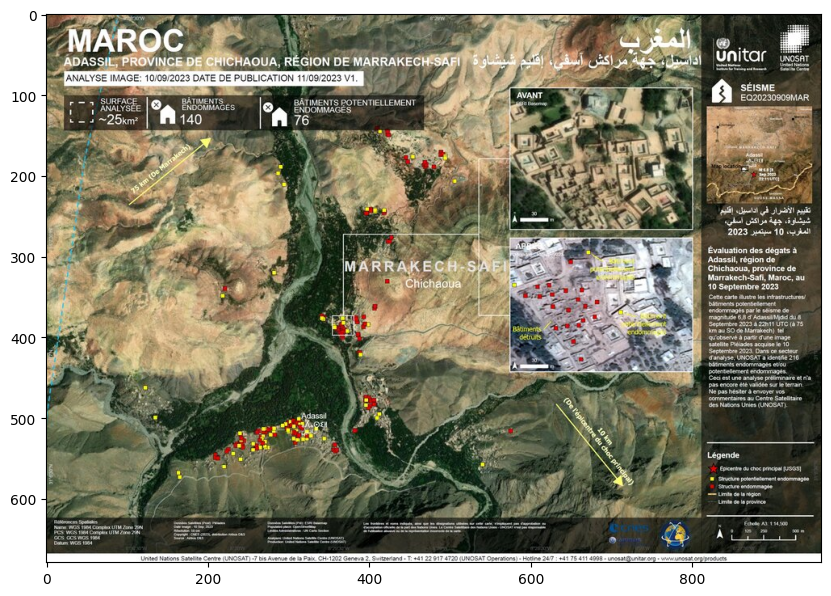

In [3]:
#There was a 6.8 magnitude earthquake that struck the Atlas Mountains, about 75 km from Marrakech, Morocco on 8 September, 2023

fig, ax = plt.subplots(1, 1,figsize=(10, 10))
ax.imshow(Image.open("/content/sample_data/Morocco_earthquake_damage_assessment_map_from_the_UNOSAT_team_article.jpg"))

What are the key actions following an earthquake

 * Safety and Assessment: Evaluate the stability of buildings and infrastructure.

 * Allocate resources: Direct assiatnce to areas that are impacted the most.

AIM:
Create a dataset using OSM polygons to annotate buildings in sentineal-2 imagery. Then use the dataset to train an object detector(ML/AI) to detect buildings in an unmapped location.

In [4]:
!pip install geojson

In [5]:
!pip install osmnx

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.6/56.6 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.5/107.5 kB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 27.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 44.5 MB/s eta 0:00:00
  Attempting uninstall: geopandas
    Found existing installation: geopandas 1.0.1
    Uninstalling geopandas-1.0.1:
      Successfully uninstalled geopandas-1.0.1


In [6]:

#I am using osmnx, other options will work as well
import osmnx as ox
#save the data in geojson format
import geojson
#geopandas for data manipulations
import geopandas as gpd
#for API requesst
#import requests

In [7]:
# Define the area of interest (AOI)
place_name = "Marrakech, Morocco"
area_of_interest = ox.geocode_to_gdf(place_name)



In [8]:
# Get building footprints for "Marrakech, Morocco"
buildings = ox.features_from_place(place_name, tags={"building": True})

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


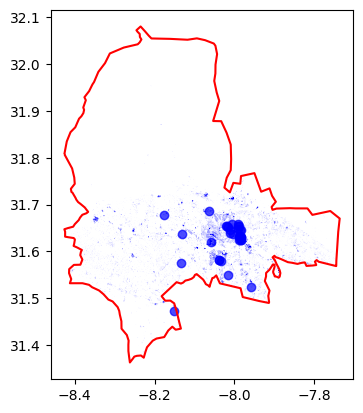

In [9]:
# Plot the area and buildings for visualization

fig, ax = plt.subplots()
area_of_interest.boundary.plot(ax=ax, color="red")
buildings.plot(ax=ax, color="blue", alpha=0.7)
plt.show()

In [10]:
# Save the building footprints for further use
#buildings.to_file("marrakech_buildings.geojson", driver="GeoJSON")

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [13]:
#Check the total number of buildings from osm

buildings=buildings[['geometry']]

print('the number of buildings are: ',len(buildings))

the number of buildings are:  177572


Node: A node represents a single point on the Earth's surface.

Way: A way is a sequence of connected nodes that represents a linear feature, such as a road, river, or trail

Relations define complex relationships between nodes and ways, representing larger features or areas


In [14]:
#scan the returned data

buildings

geometry
element_type osmid                                                         
node         11191143745                          POINT (-8.13448 31.57575)
             11205769365                          POINT (-8.15127 31.47359)
             11220323055                          POINT (-8.13174 31.63659)
             11225254060                          POINT (-8.17740 31.67846)
way          94548333     POLYGON ((-8.25069 31.63349, -8.25050 31.63331...
...                                                                     ...
relation     17512517     POLYGON ((-8.03544 31.66947, -8.03529 31.66957...
             17532409     POLYGON ((-7.99346 31.65082, -7.99346 31.65089...
             17758166     POLYGON ((-7.98316 31.62501, -7.98329 31.62482...
             17764447     POLYGON ((-7.84229 31.62832, -7.84237 31.62842...
             17765522     POLYGON ((-7.90885 31.68369, -7.90884 31.68369...

[177572 rows x 1 columns]

In [ ]:
#get the sentinel-2 imagery from  sentinelhub . Other options will work as well.
from sentinelhub import SHConfig
from sentinelhub import SentinelHubRequest, DataCollection, MimeType, bbox_to_dimensions, BBox, CRS

#sign up for an account here: https://www.sentinel-hub.com/develop/dashboard/
# Load SentinelHub configuration
config = SHConfig(use_defaults=True)
config.instance_id = ''
config.sh_client_id = ''
config.sh_client_secret = ''

In [ ]:
# Coordinates for Marrakesh, Morocco
bounds = area_of_interest.total_bounds  # returns [minx, miny, maxx, maxy]
marrakesh_bbox = BBox(bbox=[bounds[0], bounds[1], bounds[2], bounds[3]], crs=CRS.WGS84) #Need to specifiy the coordinate system

# Define the resolution (10m per pixel)
resolution = 10  # 10 meters per pixel.
size = bbox_to_dimensions(marrakesh_bbox, resolution)

In [ ]:
#Visualise the bbox
marrakesh_bbox

BBox(((-8.42606, 31.3632786), (-7.73605, 32.0799551)), crs=CRS('4326'))

In [ ]:
# Define the Sentinel-2 imagery request (True Color Composite)
request = SentinelHubRequest(
    evalscript="""
        // Normalized True Color script
        return [B04 * 2.5, B03 * 2.5, B02 * 2.5]; // Sentinel-2 bands for RGB
    """,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL2_L1C,
            time_interval=('2023-09-01', '2023-09-15')  # Date range around the earthquake
        )
    ],
    data_folder= "/path/to/where/.tiff/file/will/be/saved/",
    responses=[SentinelHubRequest.output_response("default", MimeType.TIFF)],
    bbox=bbox,
    size=bbox_to_dimensions(bbox, resolution),
    config=config
)


In [ ]:
# Execute the request and save the image
image_data = request.get_data(save_data=True)

In [ ]:
#Visualise it
image = image_data[0]
fig, ax = plt.subplots(1, 1)
ax.imshow(image)

In [16]:
!pip install rasterio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 89.7 MB/s eta 0:00:00


<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _GenerativeAIImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _BokehImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _AltairImportHook.find_spec() not found; falling back to find_module()
/usr/local/lib/python3.10/dist-packages/google/colab/_pip.py:86: ResourceWarning: unclosed file <_io.TextIOWrapper name='/usr/local/lib

In [17]:
#We use rasterio to read and write various raster formats, for example GeoTIFF
import rasterio
from rasterio.features import rasterize
from rasterio.windows import Window

#We use shapely to manipulate, and analyze geometric objects such as points, polygons
from shapely.geometry import box
from shapely.geometry import shape, box
from shapely.geometry import Polygon, Point

# for image filtering and edge detections
#from skimage.transform import resize

#We try to store the data in COC format, hence we need json
import json

<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _GenerativeAIImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _BokehImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _AltairImportHook.find_spec() not found; falling back to find_module()


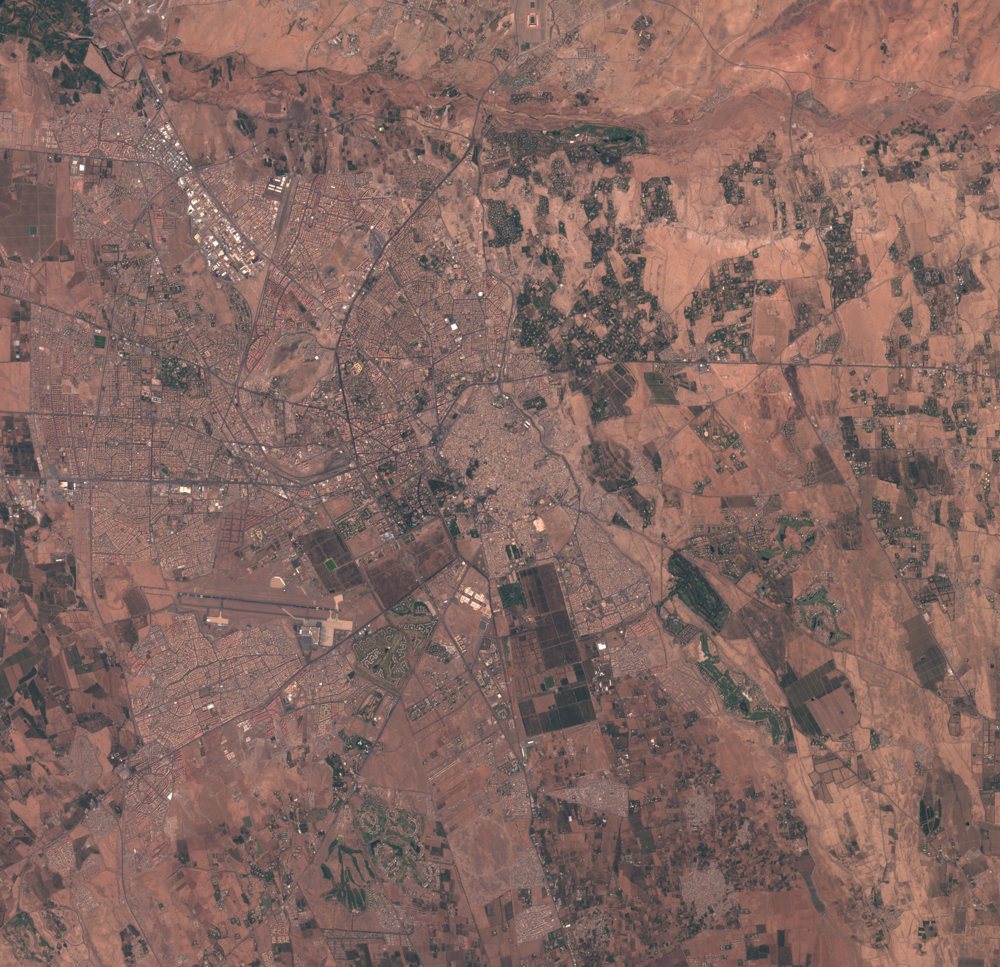

In [23]:
#Visialise the Sentinel-2 image
 Image.open("/content/sample_data/response.tiff")

In [18]:
 #Remove the background to visualise just the buildings
with rasterio.open('/content/response.tiff') as src:
    out_image = src.read([1,2,3])  # Read the first band (you can modify for your needs)
    out_transform = src.transform


# Rasterize geometries to the shape of the Sentinel image
shapes = ((geom, 255) for geom in buildings.geometry)

out_shape = src.shape
rasterized_buildings = rasterize(
    shapes=shapes,
    out_shape=out_shape,
    transform=out_transform,
    fill=0,  # Background value
    all_touched=True,  # To mark any pixel touched by the shape
    dtype=rasterio.uint8
)

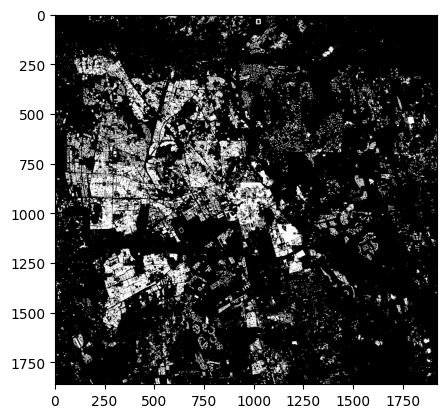

In [19]:
plt.imshow(rasterized_buildings, cmap='gray')
plt.show()

In [24]:
#Split into tiles

def split_tiff_to_png(tiff_path, tile_output_dir, tile_size=256):
    """
    This function uses rasterio to read a the .tiff file  we already downloaeded from sentinelhub and saved to disk.
    It splits the large TIFF image into smaller tiles and save them as PNG images.
    """
    with rasterio.open(tiff_path) as src:
        for i in range(0, src.height, tile_size):
            for j in range(0, src.width, tile_size):
                window = Window(j, i, tile_size, tile_size)
                transform = rasterio.windows.transform(window, src.transform)

                # Read the data in the window
                data = src.read(window=window)

                # Ensure we have 3 channels (RGB)
                if data.shape[0] > 3:
                    data = data[:3]
                elif data.shape[0] < 3:
                    continue  # Skip if less than 3 channels

                # Normalize to 0-255 and convert to PNG format
                data = np.transpose(data, (1, 2, 0))  # CHW -> HWC
                data = (data - data.min()) / (data.max() - data.min()) * 255
                data = data.astype(np.uint8)

                # Create and save PIL image
                img = Image.fromarray(data)
                tile_name = f"tile_{i}_{j}.png"
                img.save(os.path.join(tile_output_dir, tile_name))

                yield tile_name, transform, tile_size, (i, j)

In [25]:
def create_binary_mask(tile_transform, tile_size, intersecting_geoms,mask_output_dir, mask_name):
    """
    Because of resolution constraint, our ground truth will hte masks of buildings in the sentinel2 images
    This function creates a binary mask for buildings based on the OSM geometries that intersect with the tile.
    """
    mask = np.zeros((tile_size, tile_size), dtype=np.uint8)

    if len(intersecting_geoms) > 0:
        shapes = ((geom, 1) for geom in intersecting_geoms)
        mask = rasterize(
            shapes=shapes,
            out_shape=(tile_size, tile_size),
            transform=tile_transform,
            fill=0, # Background value
            dtype=np.uint8
        )

    # Save the mask as a PNG file
    mask_img = Image.fromarray(mask * 255)  # Convert 0-1 mask to 0-255 for PNG format
    mask_img.save(os.path.join(mask_output_dir, mask_name))

    return mask

In [26]:

# Coordinate transformation
def convert_and_clip_bbox(tile_transform, tile_size, minx, miny, maxx, maxy):
    """
    Convert geographic coordinates to pixel coordinates and clip to tile boundaries.
    """
    row_min, col_min = rasterio.transform.rowcol(tile_transform, minx, maxy)
    row_max, col_max = rasterio.transform.rowcol(tile_transform, maxx, miny)

    row_min, row_max = min(row_min, row_max), max(row_min, row_max)
    col_min, col_max = min(col_min, col_max), max(col_min, col_max)

    row_min = max(0, row_min)
    col_min = max(0, col_min)
    row_max = min(tile_size, row_max)
    col_max = min(tile_size, col_max)

    if row_max > row_min and col_max > col_min:
        return [col_min, row_min, col_max, row_max]
    else:
        return None

In [27]:

#Create a json file containing the bbox, mask and tiles

def create_faster_rcnn_dataset_with_masks(tiff_path, osm_path, output_dir, annotation_file, mask_dir, tile_size=256):
    """
    The functions creates a dataset in COCO format with binary masks and bounding boxes from Sentinel-2 imagery and OSM data.
    It brings together split_tiff_to_png(tiff_path, tile_output_dir, tile_size=256), create_binary_mask(tile_transform, tile_size, intersecting_geoms,mask_output_dir, mask_name) and
    convert_and_clip_bbox(tile_transform, tile_size, minx, miny, maxx, maxy) to create the training dataset
    """
    os.makedirs(output_dir, exist_ok=True)
    os.makedirs(mask_dir, exist_ok=True)

    gdf = gpd.read_file(osm_path)
    annotations = []

    for tile_name, tile_transform, tile_size, (i, j) in split_tiff_to_png(tiff_path, output_dir, tile_size):
        tile_bounds = rasterio.transform.array_bounds(tile_size, tile_size, tile_transform)
        tile_box = box(*tile_bounds)

        intersecting = gdf[gdf.geometry.intersects(tile_box)]

        boxes = []
        labels = []
        intersecting_geoms = []

        for _, row in intersecting.iterrows():
            intersection = row.geometry.intersection(tile_box)

            # Check the bounding box dimensions (min width/height >= 0 meters)
            if not intersection.is_empty:
                minx, miny, maxx, maxy = intersection.bounds
                width = maxx - minx
                height = maxy - miny

                # Ensure both width and height are at least 0 meters
                if width >= 0 and height >= 0:
                    pixel_bbox = convert_and_clip_bbox(tile_transform, tile_size, minx, miny, maxx, maxy)

                    if pixel_bbox is not None:
                        boxes.append(pixel_bbox)
                        labels.append(1)  # Label for "building"
                        intersecting_geoms.append(intersection)

        # Create and save the binary mask
        mask_name = f"mask_{i}_{j}.png"
        if len(intersecting_geoms) > 0:
            create_binary_mask(tile_transform, tile_size, intersecting_geoms, mask_dir, mask_name)

        if len(boxes) > 0:
            annotations.append({
                "tile_path": tile_name,
                "mask_path": mask_name,
                "boxes": boxes,
                "labels": labels
            })

    with open(annotation_file, 'w') as f:
        json.dump(annotations, f)

    print(f"Created dataset with {len(annotations)} annotated tiles and masks.")


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [40]:

#Specify paths:/content/drive

#input paths: provide path to where .geojson file from osmnx
tiff_path = '/content/sample_data/response.tiff'
osm_path = '/content/sample_data/marrakech_buildings.geojson'

#Output paths: Provide path to folders where the data will be savedd.
output_dir = '/content/drive/output_tiles'
mask_dir = '/content/drive/output_masks'
json_path = '/content/drive/annotation.json'



In [41]:

#Run the code
create_faster_rcnn_dataset_with_masks(
    tiff_path=tiff_path,
    osm_path=osm_path,
    output_dir=output_dir ,
    annotation_file=json_path ,
    mask_dir=mask_dir,
    tile_size=256
)

OSError: [Errno 95] Operation not supported: '/content/drive/output_tiles'

In [ ]:
with open(json_path, 'r') as f:
    building_data = json.load(f)

In [ ]:
def display_image_with_bboxes(image_path, bboxes):
    """
    Display the image with all bounding boxes from the dataframe.

    Parameters:
    - image_path: Path to the image file
    - bboxes: List of bounding boxes, each in format [minx, miny, maxx, maxy]
    """
    # Open the image using PIL
    image = Image.open(image_path)

    # Plot the image using matplotlib
    fig, ax = plt.subplots(1, 1)
    ax.imshow(image)

    # Draw all bounding boxes on the image
    for bbox in bboxes:
        minx, miny, maxx, maxy = bbox

        # Calculate width and height of the bounding box
        width = maxx - minx
        height = maxy - miny

        # Create a rectangle patch for the bounding box
        rect = patches.Rectangle((minx, miny), width, height, linewidth=2, edgecolor='r', facecolor='none')

        # Add the rectangle to the plot
        ax.add_patch(rect)

    # Display the plot
    plt.show()

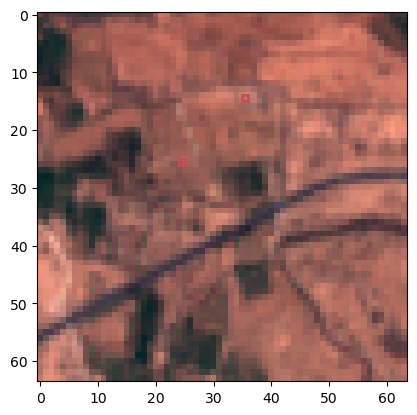

In [ ]:
display_image_with_bboxes(os.path.join(output_dir,building_data[19]['tile_path']), building_data[19]['boxes'] )

In [ ]:
#how many buildings are there?
len(building_data[19]['boxes'])

2

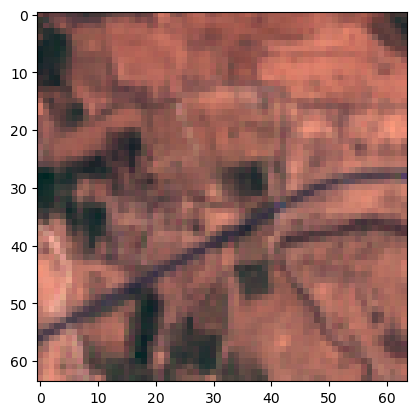

In [ ]:
    # Plot of the same place without the bounding boxes
fig, ax = plt.subplots(1, 1)
ax.imshow(Image.open(os.path.join(output_dir,building_data[19]['tile_path'])))

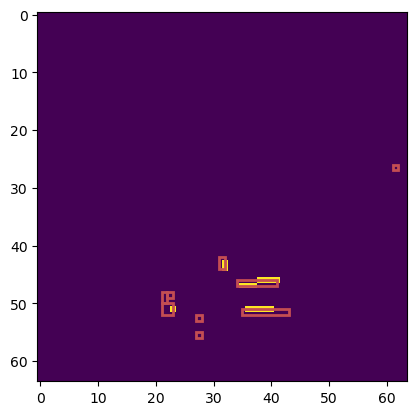

In [ ]:
display_image_with_bboxes(os.path.join(mask_dir,building_data[4]['mask_path']), building_data[4]['boxes'] )

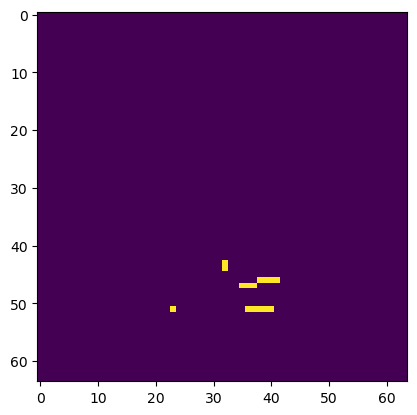

In [ ]:
 # Plot the image using matplotlib
fig, ax = plt.subplots(1, 1)
ax.imshow(Image.open(os.path.join(mask_dir,building_data[4]['mask_path'])))

YOLO: You Only Look Once
YOLO (You Only Look Once) is a state-of-the-art object detection algorithm that has gained significant popularity due to its speed and accuracy.  
YOLO divides the input image into a grid of cells. Each cell is responsible for predicting a fixed number of bounding boxes and their corresponding class probabilities


YOLO has found applications in various fields, including:

Computer Vision: Object detection, image classification, and instance segmentation.
Autonomous Vehicles: Detecting pedestrians, vehicles, and other objects for safe navigation.
Surveillance: Monitoring and tracking objects in videos for security purposes.
Medical Imaging: Analyzing medical images to identify abnormalities or diseases.
Robotics: Enabling robots to perceive and interact with their environment.



In [31]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 881.4/881.4 kB 38.2 MB/s eta 0:00:00


/usr/local/lib/python3.10/dist-packages/google/colab/_pip.py:86: ResourceWarning: unclosed file <_io.TextIOWrapper name='/usr/local/lib/python3.10/dist-packages/ultralytics-8.3.3.dist-info/top_level.txt' mode='r' encoding='UTF-8'>
  for line in open(toplevel):
/usr/local/lib/python3.10/dist-packages/google/colab/_pip.py:86: ResourceWarning: unclosed file <_io.TextIOWrapper name='/usr/local/lib/python3.10/dist-packages/ultralytics_thop-2.0.8.dist-info/top_level.txt' mode='r' encoding='UTF-8'>
  for line in open(toplevel):


In [32]:

from ultralytics import YOLO
import yaml

<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _GenerativeAIImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _BokehImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _AltairImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:671: ImportWarning: _OpenCVImportHook.exec_module() not found; falling back to load_module()
<frozen impo

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _GenerativeAIImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _BokehImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _AltairImportHook.find_spec() not found; falling back to find_module()


In [33]:
def convert_coco_to_yolo(json_file, output_dir):
    # Create output directories
    images_dir = os.path.join(output_dir, 'images')
    labels_dir = os.path.join(output_dir, 'labels')
    os.makedirs(images_dir, exist_ok=True)
    os.makedirs(labels_dir, exist_ok=True)

    # Load JSON data
    with open(json_file, 'r') as f:
        data = json.load(f)

    # Process each annotation
    for item in data:
        image_path = item['mask_path']
        #image_path = item['mask_path']
        mask_path = item['mask_path']
        boxes = item['boxes']
        labels = item['labels']

        # Open image to get dimensions
        with Image.open(os.path.join(output_dir,image_path) )as img:
            img_width, img_height = img.size

        # Create YOLO format text file
        txt_filename = os.path.splitext(os.path.basename(image_path))[0] + '.txt'
        txt_path = os.path.join(labels_dir, txt_filename)

        with open(txt_path, 'w') as f:
            for box, label in zip(boxes, labels):
                # Convert box coordinates to YOLO format
                x_min, y_min, x_max, y_max = box
                x_center = (x_min + x_max) / (2 * img_width)
                y_center = (y_min + y_max) / (2 * img_height)
                width = (x_max - x_min) / img_width
                height = (y_max - y_min) / img_height

                # Write to file (assuming label starts from 0 for YOLO)
                f.write(f"{label-1} {x_center} {y_center} {width} {height}\n")

        # Copy image to dataset directory
        os.system(f"cp {os.path.join(output_dir,image_path)} {os.path.join(images_dir, os.path.basename(image_path))}")

    print(f"Dataset created in {output_dir}")

    # Create train.txt file with relative paths
    with open(os.path.join(output_dir, 'train.txt'), 'w') as f:
        for item in data:
            f.write(f"./images/{os.path.basename(item['mask_path'])}\n")

In [ ]:
json_file = json_path

convert_coco_to_yolo(json_file,mask_dir)

Dataset created in /Users/obinna/Downloads/Lecture_note/sentinel_images/R-CNN/tiles13/RCNNmasks


In [ ]:
def create_data_yaml(dataset_path, num_classes):
    data_yaml = {
        'train': os.path.join(dataset_path, 'images'),
        'val': os.path.join(dataset_path, 'images'),  # Using same as train for this example
        'nc': num_classes,
        'names': ['building']  # Adjust class names as needed
    }

    with open(os.path.join(dataset_path, 'data.yaml'), 'w') as f:
        yaml.dump(data_yaml, f)

    return os.path.join(dataset_path, 'data.yaml')



In [ ]:
def fine_tune_yolov8(dataset_path, epochs=100, img_size=256, batch_size=4):
    # Create data.yaml file
    data_yaml_path = create_data_yaml(dataset_path, num_classes=1)  # Adjust num_classes as needed

    # Load a pretrained YOLOv8 model
    model = YOLO('yolov8n.pt')  # 'n' for nano, you can change to 's', 'm', 'l', or 'x' for other sizes

    # Fine-tune the model
    results = model.train(
        data=data_yaml_path,
        epochs=epochs,
        imgsz=img_size,
        batch=batch_size,
        name='yolov8_fine_tuned'
    )

    print(f"Training complete. Results saved in {results}")

    # Perform validation
    val_results = model.val()
    print(f"Validation results: {val_results}")

    return model

In [ ]:
dataset_path =  mask_dir
fine_tuned_model = fine_tune_yolov8(dataset_path,img_size=64, batch_size=4)

New https://pypi.org/project/ultralytics/8.3.0 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.2.100 🚀 Python-3.12.2 torch-2.4.1 CPU (Apple M1)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/Users/obinna/Downloads/Lecture_note/sentinel_images/R-CNN/tiles13/RCNNmasks/data.yaml, epochs=100, time=None, patience=100, batch=4, imgsz=64, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=yolov8_fine_tuned4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None,

train: Scanning /Users/obinna/Downloads/Lecture_note/sentinel_images/R-CNN/tiles13/RCNNmasks/labels.cache... 514 images, 0 backgrounds, 0 corrupt: 100%|██████████| 514/514 [00:00<?, ?it/s]

train: WARNING ⚠️ /Users/obinna/Downloads/Lecture_note/sentinel_images/R-CNN/tiles13/RCNNmasks/images/mask_1024_1088.png: 3 duplicate labels removed
train: WARNING ⚠️ /Users/obinna/Downloads/Lecture_note/sentinel_images/R-CNN/tiles13/RCNNmasks/images/mask_1024_1536.png: 1 duplicate labels removed
train: WARNING ⚠️ /Users/obinna/Downloads/Lecture_note/sentinel_images/R-CNN/tiles13/RCNNmasks/images/mask_1024_192.png: 3 duplicate labels removed
train: WARNING ⚠️ /Users/obinna/Downloads/Lecture_note/sentinel_images/R-CNN/tiles13/RCNNmasks/images/mask_1024_256.png: 56 duplicate labels removed
train: WARNING ⚠️ /Users/obinna/Downloads/Lecture_note/sentinel_images/R-CNN/tiles13/RCNNmasks/images/mask_1024_320.png: 46 duplicate labels removed
train: WARNING ⚠️ /Users/obinna/Downloads/Lecture_note/sentinel_images/R-CNN/tiles13/RCNNmasks/images/mask_1024_384.png: 20 duplicate labels removed
train: WARNING ⚠️ /Users/obinna/Downloads/Lecture_note/sentinel_images/R-CNN/tiles13/RCNNmasks/images/mask_


val: Scanning /Users/obinna/Downloads/Lecture_note/sentinel_images/R-CNN/tiles13/RCNNmasks/labels.cache... 514 images, 0 backgrounds, 0 corrupt: 100%|██████████| 514/514 [00:00<?, ?it/s]

train: WARNING ⚠️ /Users/obinna/Downloads/Lecture_note/sentinel_images/R-CNN/tiles13/RCNNmasks/images/mask_1024_1088.png: 3 duplicate labels removed
train: WARNING ⚠️ /Users/obinna/Downloads/Lecture_note/sentinel_images/R-CNN/tiles13/RCNNmasks/images/mask_1024_1536.png: 1 duplicate labels removed
train: WARNING ⚠️ /Users/obinna/Downloads/Lecture_note/sentinel_images/R-CNN/tiles13/RCNNmasks/images/mask_1024_192.png: 3 duplicate labels removed
train: WARNING ⚠️ /Users/obinna/Downloads/Lecture_note/sentinel_images/R-CNN/tiles13/RCNNmasks/images/mask_1024_256.png: 56 duplicate labels removed
train: WARNING ⚠️ /Users/obinna/Downloads/Lecture_note/sentinel_images/R-CNN/tiles13/RCNNmasks/images/mask_1024_320.png: 46 duplicate labels removed
train: WARNING ⚠️ /Users/obinna/Downloads/Lecture_note/sentinel_images/R-CNN/tiles13/RCNNmasks/images/mask_1024_384.png: 20 duplicate labels removed
train: WARNING ⚠️ /Users/obinna/Downloads/Lecture_note/sentinel_images/R-CNN/tiles13/RCNNmasks/images/mask_

Plotting labels to runs/detect/yolov8_fine_tuned4/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 64 train, 64 val
Using 0 dataloader workers
Logging results to runs/detect/yolov8_fine_tuned4
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100         0G      3.941      2.598      1.035         33         64: 100%|██████████| 129/129 [00:08<00:00, 14.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 16.52it/s]

                   all        514      63491    0.00569    0.00239    0.00782    0.00333



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100         0G      4.648      2.039      1.021         40         64: 100%|██████████| 129/129 [00:07<00:00, 17.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:04<00:00, 15.61it/s]

                   all        514      63491     0.0165    0.00967    0.00971    0.00263



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100         0G      4.475        1.9     0.9296          7         64: 100%|██████████| 129/129 [00:06<00:00, 19.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 17.49it/s]

                   all        514      63491     0.0302     0.0112     0.0147    0.00538



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100         0G      4.526      1.839     0.9038         50         64: 100%|██████████| 129/129 [00:06<00:00, 18.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 17.67it/s]

                   all        514      63491     0.0266     0.0111     0.0186    0.00516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100         0G      4.352      1.814        0.9         34         64: 100%|██████████| 129/129 [00:07<00:00, 17.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:05<00:00, 12.11it/s]

                   all        514      63491      0.104     0.0109     0.0189    0.00588



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100         0G      4.366      1.788     0.8788         67         64: 100%|██████████| 129/129 [00:08<00:00, 15.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 17.24it/s]

                   all        514      63491      0.126     0.0123     0.0158    0.00458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100         0G      4.317      1.732     0.8878         34         64: 100%|██████████| 129/129 [00:06<00:00, 19.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 17.45it/s]


                   all        514      63491     0.0664     0.0107      0.012    0.00382

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100         0G      4.244      1.728     0.8715         59         64: 100%|██████████| 129/129 [00:06<00:00, 19.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 19.14it/s]

                   all        514      63491     0.0458     0.0145     0.0276    0.00825



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100         0G      4.205       1.66     0.8721         14         64: 100%|██████████| 129/129 [00:08<00:00, 15.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:04<00:00, 14.25it/s]

                   all        514      63491     0.0421     0.0163     0.0281     0.0085



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100         0G       4.23      1.747     0.8617         67         64: 100%|██████████| 129/129 [00:06<00:00, 20.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 17.28it/s]

                   all        514      63491     0.0501     0.0181     0.0311    0.00797



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100         0G       4.14      1.619      0.875        124         64: 100%|██████████| 129/129 [00:06<00:00, 19.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:04<00:00, 15.22it/s]

                   all        514      63491      0.193     0.0152     0.0193    0.00669



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100         0G      4.191      1.643     0.8793        103         64: 100%|██████████| 129/129 [00:09<00:00, 13.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:04<00:00, 15.42it/s]

                   all        514      63491     0.0524     0.0175     0.0329    0.00949



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100         0G      4.067      1.604     0.8583          9         64: 100%|██████████| 129/129 [00:07<00:00, 16.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 16.92it/s]

                   all        514      63491     0.0434     0.0151     0.0279    0.00858



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100         0G      4.113      1.608     0.8706        108         64: 100%|██████████| 129/129 [00:06<00:00, 19.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 18.86it/s]

                   all        514      63491      0.052      0.018     0.0329     0.0106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100         0G      3.989      1.558     0.8778         82         64: 100%|██████████| 129/129 [00:06<00:00, 19.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 17.92it/s]

                   all        514      63491     0.0573     0.0183     0.0301    0.00838



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100         0G       3.99      1.575     0.8631          9         64: 100%|██████████| 129/129 [00:06<00:00, 19.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 17.38it/s]

                   all        514      63491     0.0598     0.0176     0.0368      0.011



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100         0G      4.015      1.538     0.8513         67         64: 100%|██████████| 129/129 [00:06<00:00, 20.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 18.30it/s]

                   all        514      63491     0.0516     0.0157     0.0322    0.00877



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100         0G      3.997      1.535     0.8468         33         64: 100%|██████████| 129/129 [00:07<00:00, 17.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 17.91it/s]

                   all        514      63491     0.0432     0.0154     0.0277    0.00933



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100         0G      3.996        1.5      0.863         67         64: 100%|██████████| 129/129 [00:07<00:00, 16.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:04<00:00, 14.10it/s]


                   all        514      63491     0.0685     0.0192     0.0422     0.0133

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100         0G      3.925      1.496     0.8521         17         64: 100%|██████████| 129/129 [00:07<00:00, 18.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 17.94it/s]


                   all        514      63491     0.0613     0.0184      0.038     0.0118

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100         0G      3.925      1.478     0.8524        117         64: 100%|██████████| 129/129 [00:07<00:00, 16.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 18.94it/s]

                   all        514      63491      0.164     0.0209     0.0453     0.0141



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100         0G      3.902      1.485     0.8494         14         64: 100%|██████████| 129/129 [00:06<00:00, 19.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:04<00:00, 16.16it/s]


                   all        514      63491     0.0833     0.0222     0.0514     0.0153

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100         0G      3.891      1.473     0.8463         96         64: 100%|██████████| 129/129 [00:07<00:00, 17.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 18.55it/s]

                   all        514      63491     0.0654     0.0203      0.041     0.0127



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100         0G      3.873      1.477     0.8462         98         64: 100%|██████████| 129/129 [00:06<00:00, 20.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 19.26it/s]

                   all        514      63491     0.0687     0.0191     0.0416     0.0125



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100         0G      3.871      1.444     0.8443         87         64: 100%|██████████| 129/129 [00:06<00:00, 20.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 17.14it/s]

                   all        514      63491     0.0772      0.021     0.0476     0.0148



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100         0G      3.876      1.398     0.8569         44         64: 100%|██████████| 129/129 [00:06<00:00, 20.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 19.36it/s]

                   all        514      63491     0.0813     0.0201     0.0481     0.0152



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100         0G      3.803      1.386     0.8452         56         64: 100%|██████████| 129/129 [00:06<00:00, 21.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 19.25it/s]

                   all        514      63491     0.0692      0.022     0.0427     0.0125



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100         0G      3.803       1.42     0.8462         88         64: 100%|██████████| 129/129 [00:06<00:00, 19.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 19.10it/s]

                   all        514      63491     0.0729      0.023     0.0459     0.0144



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100         0G      3.733      1.387     0.8421          3         64: 100%|██████████| 129/129 [00:06<00:00, 20.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:04<00:00, 15.81it/s]

                   all        514      63491     0.0764     0.0207     0.0467     0.0134



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100         0G      3.789      1.386     0.8489         83         64: 100%|██████████| 129/129 [00:06<00:00, 20.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 18.82it/s]

                   all        514      63491      0.072     0.0179     0.0426     0.0124



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100         0G      3.771       1.44     0.8309         28         64: 100%|██████████| 129/129 [00:06<00:00, 21.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 19.42it/s]

                   all        514      63491      0.073     0.0191     0.0434      0.013



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100         0G      3.863      1.417     0.8341         64         64: 100%|██████████| 129/129 [00:06<00:00, 21.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 18.79it/s]

                   all        514      63491     0.0852     0.0215     0.0515     0.0167



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100         0G      3.784      1.408     0.8335          8         64: 100%|██████████| 129/129 [00:06<00:00, 21.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:04<00:00, 15.28it/s]

                   all        514      63491     0.0873     0.0235     0.0531     0.0159



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100         0G       3.73      1.419     0.8451         20         64: 100%|██████████| 129/129 [00:07<00:00, 16.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 18.86it/s]

                   all        514      63491     0.0941     0.0231     0.0565     0.0163



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100         0G      3.779       1.38     0.8354         86         64: 100%|██████████| 129/129 [00:06<00:00, 20.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 17.99it/s]


                   all        514      63491     0.0688     0.0179      0.041     0.0115

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100         0G      3.746       1.38     0.8299         44         64: 100%|██████████| 129/129 [00:11<00:00, 11.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 17.99it/s]

                   all        514      63491     0.0863     0.0239     0.0534     0.0169



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100         0G      3.772       1.35     0.8379          3         64: 100%|██████████| 129/129 [00:08<00:00, 15.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 18.82it/s]

                   all        514      63491      0.103     0.0235     0.0608     0.0189



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100         0G      3.677      1.372     0.8302         60         64: 100%|██████████| 129/129 [00:07<00:00, 18.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 17.98it/s]

                   all        514      63491      0.173      0.026     0.0562     0.0182



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100         0G       3.77      1.404     0.8331         28         64: 100%|██████████| 129/129 [00:06<00:00, 20.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 18.55it/s]

                   all        514      63491     0.0876     0.0241     0.0537     0.0173



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100         0G      3.747      1.451     0.8348         58         64: 100%|██████████| 129/129 [00:06<00:00, 19.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 17.50it/s]

                   all        514      63491     0.0891     0.0231     0.0539     0.0171



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100         0G      3.779      1.391     0.8318         42         64: 100%|██████████| 129/129 [00:06<00:00, 19.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 17.53it/s]

                   all        514      63491      0.188     0.0246     0.0463     0.0148



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100         0G      3.747      1.381     0.8473         66         64: 100%|██████████| 129/129 [00:06<00:00, 20.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 18.35it/s]

                   all        514      63491     0.0761     0.0211      0.046     0.0131



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100         0G      3.715       1.39     0.8427         33         64: 100%|██████████| 129/129 [00:07<00:00, 16.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 17.47it/s]


                   all        514      63491     0.0931     0.0251     0.0568     0.0171

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100         0G      3.662      1.345     0.8459         52         64: 100%|██████████| 129/129 [00:06<00:00, 20.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 18.74it/s]

                   all        514      63491     0.0783     0.0248     0.0491     0.0153



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100         0G      3.706      1.357     0.8335         74         64: 100%|██████████| 129/129 [00:06<00:00, 19.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:04<00:00, 14.34it/s]

                   all        514      63491      0.205     0.0257     0.0553     0.0183



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100         0G      3.713       1.38     0.8349         67         64: 100%|██████████| 129/129 [00:07<00:00, 17.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:04<00:00, 14.70it/s]

                   all        514      63491     0.0946     0.0226     0.0558     0.0169



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100         0G      3.643      1.348     0.8352         49         64: 100%|██████████| 129/129 [00:06<00:00, 19.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 17.94it/s]


                   all        514      63491      0.103     0.0222     0.0602     0.0181

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100         0G      3.694      1.368     0.8327         54         64: 100%|██████████| 129/129 [00:06<00:00, 19.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 17.45it/s]

                   all        514      63491      0.101     0.0264     0.0614     0.0186



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100         0G      3.629      1.361     0.8188         26         64: 100%|██████████| 129/129 [00:08<00:00, 15.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 16.70it/s]

                   all        514      63491      0.102     0.0274     0.0624     0.0195



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100         0G      3.656      1.358      0.832         12         64: 100%|██████████| 129/129 [00:06<00:00, 19.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 18.50it/s]

                   all        514      63491     0.0993     0.0257     0.0603     0.0189



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100         0G      3.595      1.342     0.8251        113         64: 100%|██████████| 129/129 [00:08<00:00, 15.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:04<00:00, 13.03it/s]


                   all        514      63491     0.0995     0.0252     0.0597     0.0182

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100         0G      3.626      1.343       0.84         18         64: 100%|██████████| 129/129 [00:07<00:00, 17.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 17.92it/s]

                   all        514      63491      0.112     0.0263     0.0663     0.0205



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100         0G      3.706      1.354     0.8357         63         64: 100%|██████████| 129/129 [00:06<00:00, 18.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:04<00:00, 15.21it/s]

                   all        514      63491      0.108     0.0253     0.0638     0.0187



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100         0G      3.636      1.322     0.8456         91         64: 100%|██████████| 129/129 [00:07<00:00, 18.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 18.53it/s]

                   all        514      63491      0.122     0.0278     0.0722     0.0214



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100         0G      3.674       1.33     0.8254         50         64: 100%|██████████| 129/129 [00:06<00:00, 18.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 17.45it/s]

                   all        514      63491      0.119     0.0255     0.0691     0.0203



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100         0G      3.654      1.328     0.8419         15         64: 100%|██████████| 129/129 [00:07<00:00, 18.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 19.02it/s]

                   all        514      63491      0.134     0.0265     0.0766     0.0232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100         0G      3.626      1.329      0.825         10         64: 100%|██████████| 129/129 [00:07<00:00, 16.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 16.68it/s]

                   all        514      63491      0.126     0.0281     0.0738      0.023



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100         0G      3.628      1.335     0.8411         46         64: 100%|██████████| 129/129 [00:07<00:00, 16.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 18.74it/s]

                   all        514      63491      0.118     0.0244     0.0681     0.0204



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100         0G      3.581      1.315     0.8297          7         64: 100%|██████████| 129/129 [00:06<00:00, 18.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 17.79it/s]


                   all        514      63491       0.14     0.0259     0.0798     0.0238

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100         0G      3.581      1.339     0.8201         72         64: 100%|██████████| 129/129 [00:07<00:00, 17.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 17.05it/s]

                   all        514      63491      0.109     0.0272     0.0643     0.0194



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100         0G      3.666      1.336     0.8408         18         64: 100%|██████████| 129/129 [00:08<00:00, 16.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 17.43it/s]

                   all        514      63491      0.131     0.0266     0.0751     0.0235



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100         0G      3.572      1.295     0.8205          6         64: 100%|██████████| 129/129 [00:07<00:00, 16.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:04<00:00, 15.89it/s]

                   all        514      63491      0.123     0.0263     0.0714     0.0227



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100         0G      3.548      1.329     0.8349        110         64: 100%|██████████| 129/129 [00:07<00:00, 18.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 16.86it/s]

                   all        514      63491      0.102     0.0299     0.0623     0.0197



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100         0G      3.598      1.348     0.8214          5         64: 100%|██████████| 129/129 [00:07<00:00, 17.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:04<00:00, 13.39it/s]

                   all        514      63491      0.125     0.0302     0.0744     0.0234



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100         0G      3.627      1.321     0.8387         87         64: 100%|██████████| 129/129 [00:08<00:00, 16.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 16.28it/s]

                   all        514      63491      0.134     0.0275     0.0774      0.024



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100         0G      3.565      1.319     0.8408         15         64: 100%|██████████| 129/129 [00:06<00:00, 18.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:05<00:00, 11.87it/s]

                   all        514      63491      0.128     0.0285     0.0747     0.0242



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100         0G      3.568      1.298     0.8413        119         64: 100%|██████████| 129/129 [00:08<00:00, 15.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:05<00:00, 12.06it/s]

                   all        514      63491       0.11     0.0276     0.0652     0.0208



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100         0G      3.626      1.319     0.8263         65         64: 100%|██████████| 129/129 [00:07<00:00, 16.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:05<00:00, 12.99it/s]

                   all        514      63491      0.113     0.0269     0.0666      0.021



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100         0G       3.61      1.335     0.8252         52         64: 100%|██████████| 129/129 [00:08<00:00, 15.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 16.37it/s]

                   all        514      63491      0.124     0.0256     0.0716     0.0219



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100         0G      3.604      1.307       0.84         16         64: 100%|██████████| 129/129 [00:07<00:00, 17.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:05<00:00, 12.44it/s]

                   all        514      63491      0.132     0.0291     0.0769     0.0246



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100         0G      3.598      1.351     0.8357         29         64: 100%|██████████| 129/129 [00:07<00:00, 16.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 17.09it/s]

                   all        514      63491     0.0889     0.0264     0.0546     0.0167



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100         0G      3.635      1.331     0.8392         98         64: 100%|██████████| 129/129 [00:07<00:00, 18.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:04<00:00, 15.66it/s]

                   all        514      63491       0.14     0.0293     0.0817     0.0265



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100         0G      3.564      1.317      0.817        199         64: 100%|██████████| 129/129 [00:07<00:00, 17.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:04<00:00, 15.35it/s]

                   all        514      63491      0.129     0.0259     0.0742     0.0218



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100         0G      3.536      1.299     0.8324         13         64: 100%|██████████| 129/129 [00:07<00:00, 17.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 16.38it/s]

                   all        514      63491      0.141     0.0264     0.0805     0.0244



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100         0G      3.543      1.327     0.8278        107         64: 100%|██████████| 129/129 [00:07<00:00, 17.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 17.82it/s]

                   all        514      63491      0.127     0.0298     0.0757      0.024



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100         0G      3.566      1.337      0.814          3         64: 100%|██████████| 129/129 [00:07<00:00, 17.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 17.33it/s]

                   all        514      63491       0.13     0.0277     0.0758     0.0239



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100         0G      3.529      1.328     0.8269         11         64: 100%|██████████| 129/129 [00:07<00:00, 18.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 17.69it/s]

                   all        514      63491      0.108     0.0285     0.0651     0.0211



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100         0G      3.551      1.309     0.8344         75         64: 100%|██████████| 129/129 [00:07<00:00, 18.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 17.24it/s]

                   all        514      63491      0.103     0.0298     0.0634     0.0209



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100         0G      3.568      1.334     0.8293         34         64: 100%|██████████| 129/129 [00:06<00:00, 18.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 18.01it/s]

                   all        514      63491      0.117     0.0287     0.0701     0.0218



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100         0G      3.518      1.311     0.8321         36         64: 100%|██████████| 129/129 [00:08<00:00, 15.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:05<00:00, 11.45it/s]

                   all        514      63491       0.12     0.0278     0.0705     0.0214



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100         0G      3.524      1.284     0.8204         91         64: 100%|██████████| 129/129 [00:07<00:00, 17.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 16.57it/s]

                   all        514      63491      0.137     0.0294     0.0796     0.0249



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100         0G      3.492      1.311     0.8351         16         64: 100%|██████████| 129/129 [00:12<00:00, 10.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 18.19it/s]

                   all        514      63491      0.139     0.0291     0.0804     0.0251



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100         0G      3.566      1.287     0.8238         92         64: 100%|██████████| 129/129 [00:10<00:00, 12.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 18.16it/s]

                   all        514      63491      0.132     0.0283     0.0766     0.0234



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100         0G       3.51      1.286     0.8351         23         64: 100%|██████████| 129/129 [00:07<00:00, 18.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 16.39it/s]

                   all        514      63491      0.135     0.0293     0.0784     0.0245



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100         0G      3.452      1.246     0.8298         78         64: 100%|██████████| 129/129 [00:08<00:00, 15.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 16.48it/s]

                   all        514      63491      0.138      0.031     0.0814     0.0266



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100         0G      3.538      1.287     0.8317         48         64: 100%|██████████| 129/129 [00:07<00:00, 17.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 18.10it/s]

                   all        514      63491      0.133     0.0281     0.0772     0.0242



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100         0G      3.508      1.253     0.8268         72         64: 100%|██████████| 129/129 [00:08<00:00, 15.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 16.68it/s]

                   all        514      63491      0.141     0.0314     0.0837     0.0268



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100         0G      3.527      1.329     0.8308        104         64: 100%|██████████| 129/129 [00:07<00:00, 16.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 16.57it/s]

                   all        514      63491      0.136     0.0292     0.0787     0.0246



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100         0G       3.49      1.284     0.8235         54         64: 100%|██████████| 129/129 [00:06<00:00, 18.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 17.21it/s]

                   all        514      63491       0.14       0.03     0.0814      0.026



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100         0G      3.433      1.268      0.827        151         64: 100%|██████████| 129/129 [00:07<00:00, 18.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 17.80it/s]

                   all        514      63491      0.137     0.0296     0.0799     0.0255


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100         0G      3.421      1.356     0.8066          1         64: 100%|██████████| 129/129 [00:06<00:00, 18.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 17.40it/s]

                   all        514      63491      0.132     0.0309     0.0781     0.0247



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100         0G      3.379        1.3     0.8014         11         64: 100%|██████████| 129/129 [00:06<00:00, 21.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 18.28it/s]

                   all        514      63491      0.132     0.0315     0.0788      0.025



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100         0G      3.401      1.288     0.7913        111         64: 100%|██████████| 129/129 [00:07<00:00, 18.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:03<00:00, 18.04it/s]

                   all        514      63491      0.134     0.0296     0.0779     0.0244



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100         0G      3.285      1.279     0.7839          0         64: 100%|██████████| 129/129 [00:07<00:00, 17.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:04<00:00, 14.41it/s]

                   all        514      63491      0.134     0.0315     0.0796     0.0254



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100         0G      3.443       1.27     0.8036         64         64: 100%|██████████| 129/129 [00:09<00:00, 14.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:04<00:00, 14.00it/s]

                   all        514      63491      0.133     0.0306     0.0787     0.0252



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100         0G      3.386      1.283     0.8139         53         64: 100%|██████████| 129/129 [00:09<00:00, 13.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:04<00:00, 13.08it/s]

                   all        514      63491      0.136     0.0308     0.0804     0.0259



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100         0G      3.308      1.251     0.7932          2         64: 100%|██████████| 129/129 [00:09<00:00, 14.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:04<00:00, 14.07it/s]

                   all        514      63491      0.138     0.0302     0.0812      0.026



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100         0G      3.356      1.262     0.7957         17         64: 100%|██████████| 129/129 [00:09<00:00, 14.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:06<00:00, 10.19it/s]

                   all        514      63491      0.139     0.0305     0.0816     0.0257



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100         0G      3.394      1.287      0.819         59         64: 100%|██████████| 129/129 [00:10<00:00, 12.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:05<00:00, 12.64it/s]

                   all        514      63491      0.139     0.0302     0.0812     0.0259



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100         0G      3.382       1.29     0.7942         30         64: 100%|██████████| 129/129 [00:09<00:00, 14.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:04<00:00, 13.56it/s]

                   all        514      63491      0.136     0.0301     0.0794     0.0254



100 epochs completed in 0.362 hours.
Optimizer stripped from runs/detect/yolov8_fine_tuned4/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/yolov8_fine_tuned4/weights/best.pt, 6.2MB

Validating runs/detect/yolov8_fine_tuned4/weights/best.pt...
Ultralytics YOLOv8.2.100 🚀 Python-3.12.2 torch-2.4.1 CPU (Apple M1)
Model summary (fused): 168 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:04<00:00, 14.54it/s]


                   all        514      63491      0.141     0.0314     0.0835     0.0269
Speed: 0.1ms preprocess, 5.1ms inference, 0.0ms loss, 0.2ms postprocess per image
Results saved to runs/detect/yolov8_fine_tuned4
Training complete. Results saved in ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x36c69f530>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,   

val: Scanning /Users/obinna/Downloads/Lecture_note/sentinel_images/R-CNN/tiles13/RCNNmasks/labels.cache... 514 images, 0 backgrounds, 0 corrupt: 100%|██████████| 514/514 [00:00<?, ?it/s]

train: WARNING ⚠️ /Users/obinna/Downloads/Lecture_note/sentinel_images/R-CNN/tiles13/RCNNmasks/images/mask_1024_1088.png: 3 duplicate labels removed
train: WARNING ⚠️ /Users/obinna/Downloads/Lecture_note/sentinel_images/R-CNN/tiles13/RCNNmasks/images/mask_1024_1536.png: 1 duplicate labels removed
train: WARNING ⚠️ /Users/obinna/Downloads/Lecture_note/sentinel_images/R-CNN/tiles13/RCNNmasks/images/mask_1024_192.png: 3 duplicate labels removed
train: WARNING ⚠️ /Users/obinna/Downloads/Lecture_note/sentinel_images/R-CNN/tiles13/RCNNmasks/images/mask_1024_256.png: 56 duplicate labels removed
train: WARNING ⚠️ /Users/obinna/Downloads/Lecture_note/sentinel_images/R-CNN/tiles13/RCNNmasks/images/mask_1024_320.png: 46 duplicate labels removed
train: WARNING ⚠️ /Users/obinna/Downloads/Lecture_note/sentinel_images/R-CNN/tiles13/RCNNmasks/images/mask_1024_384.png: 20 duplicate labels removed
train: WARNING ⚠️ /Users/obinna/Downloads/Lecture_note/sentinel_images/R-CNN/tiles13/RCNNmasks/images/mask_


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 129/129 [00:06<00:00, 20.28it/s]


                   all        514      63491      0.141     0.0314     0.0835     0.0269
Speed: 0.1ms preprocess, 8.1ms inference, 0.0ms loss, 0.3ms postprocess per image
Results saved to runs/detect/yolov8_fine_tuned42
Validation results: ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x34551dd30>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0

In [ ]:

def iou(box1, box2):
    # Calculate intersection area
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    intersection_area = max(0, x2 - x1) * max(0, y2 - y1)

    # Calculate areas
    box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])

    # Calculate IoU
    return intersection_area / float(box1_area + box2_area - intersection_area)

def process_and_visualize(model_path, image_path, confidence_threshold=0.35, iou_threshold=0.45):
    # Load fine-tuned model
    fine_tuned_model = YOLO(model_path)

    # Load the image
    img = cv2.imread(image_path)
    #print("inout image shape", img.shape[:2])

    # Run inference
    results = fine_tuned_model(img)[0]

    # List to keep track of boxes to draw
    boxes_to_draw = []

    for box in results.boxes:
        # Extract coordinates, class, and confidence score
        x_min, y_min, x_max, y_max = map(int, box.xyxy[0])  # Coordinates of the bounding box
        conf = box.conf.item()  # Confidence score
        cls = int(box.cls.item())  # Class index

        # Only consider boxes with confidence above the threshold
        if conf >= confidence_threshold:
            current_box = (x_min, y_min, x_max, y_max)
            is_best = True

            # Check for substantial overlap with already accepted boxes
            for existing_box in boxes_to_draw:
                if iou(current_box, existing_box['bbox']) > iou_threshold:
                    is_best = False
                    break

            if is_best:
                boxes_to_draw.append({
                    'bbox': current_box,
                    'conf': conf,
                    'label': fine_tuned_model.names[cls]
                })

    # Visualize the best detections (including all non-overlapping)
    for det in boxes_to_draw:
        x_min, y_min, x_max, y_max = det['bbox']
        label = det['label']
        conf = det['conf']

        # Draw the bounding box
        cv2.rectangle(img, (x_min, y_min), (x_max, y_max), (0, 255, 0), 1)

        # Draw the label and confidence score
        #cv2.putText(img, f'{label}: {conf:.2f}', (x_min, y_min - 10),
      #              cv2.FONT_HERSHEY_SIMPLEX, 0.1, (255, 0, 0), 1)

    # Convert BGR (OpenCV) image to RGB for visualization
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Display the image with bounding boxes
    plt.imshow(img_rgb)
    #plt.axis('off')
    plt.show()





In [ ]:
import glob
import torch
import cv2

In [ ]:
dataset = glob.glob(os.path.join(mask_dir,'*.png'))
dataset_tile = glob.glob(os.path.join(output_dir,'*.png'))

In [ ]:

model_path = "/Users/obinna/Downloads/Lecture_note/YOLO_buildings/Training_with_tiles/runs/detect/yolov8_fine_tuned/weights/best.pt"




0: 64x64 8 buildings, 13.8ms
Speed: 1.9ms preprocess, 13.8ms inference, 2.5ms postprocess per image at shape (1, 3, 64, 64)


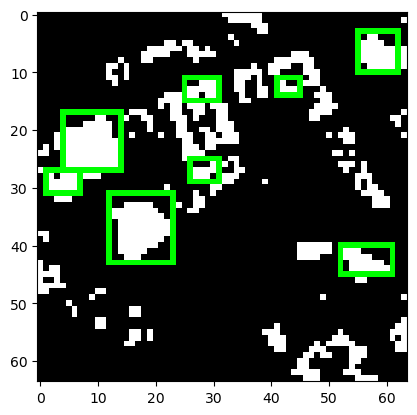

In [ ]:
process_and_visualize(model_path3, dataset[4])


0: 256x256 37 buildings, 25.6ms
Speed: 2.7ms preprocess, 25.6ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 256)


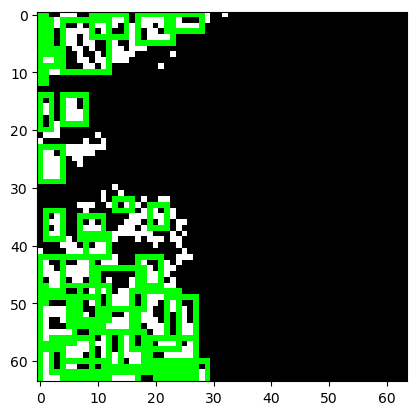

In [ ]:
process_and_visualize(model_path2, dataset[5])

Going further: Improve the resolution first.

1. https://arxiv.org/html/2310.11622v2 : High-resolution building and road detection from Sentinel-2.  Use GAN-like approach to generate high resolution images

2. HIECTOR: HIErarchical object deteCTOR https://github.com/sentinel-hub/hiector

3. Use Stable diffusion super-resolution: https://huggingface.co/docs/diffusers/en/api/pipelines/stable_diffusion/upscale

